In [1]:
def show_image(image, title='Image', cmap_type='gray'):
    plt.imshow(image, cmap=cmap_type)
    plt.title(title)
    plt.axis('off')
    plt.show()

In [2]:
from skimage import data, color
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [3]:
rocket_image = data.rocket()

In [4]:
gray_scale = color.rgb2gray(rocket_image)
# rgb = color.gray2rgb(gray_scale)

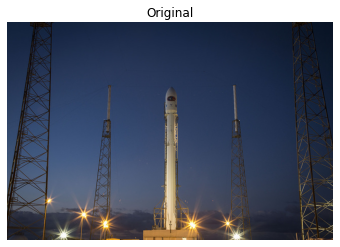

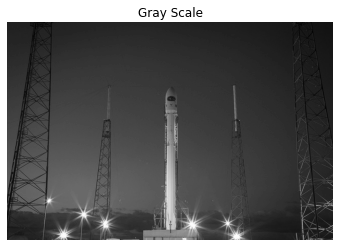

In [5]:
show_image(rocket_image, 'Original')
show_image(gray_scale, 'Gray Scale')

In [6]:
coffee_image = data.coffee()
coin_image = data.coins()

In [7]:
coffee_image.shape

(400, 600, 3)

In [8]:
coin_image.shape

(303, 384)

In [9]:
coffee_gray_scale = color.rgb2gray(coffee_image)
coin_gray_scale = color.rgb2gray(coin_image)

<ipython-input-9-a3f76ad69053>:2: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  coin_gray_scale = color.rgb2gray(coin_image)


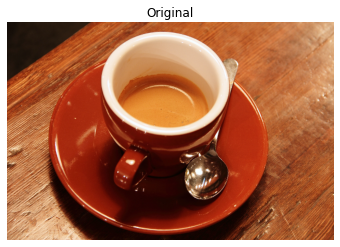

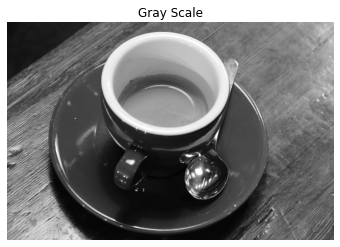

In [10]:
show_image(coffee_image, 'Original')
show_image(coffee_gray_scale, 'Gray Scale')

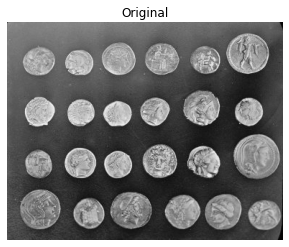

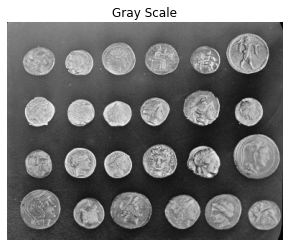

In [11]:
show_image(coin_image, 'Original')
show_image(coin_gray_scale, 'Gray Scale')

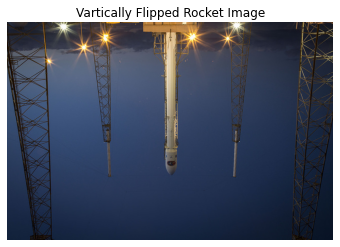

In [12]:
vertically_flipped_image = np.flipud(rocket_image)
show_image(vertically_flipped_image, 'Vartically Flipped Rocket Image')

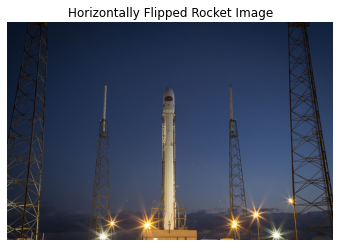

In [13]:
horizontally_flipped_image = np.fliplr(rocket_image)
show_image(horizontally_flipped_image, 'Horizontally Flipped Rocket Image')

In [14]:
type(rocket_image)

numpy.ndarray

In [15]:
rocket_image.size

819840

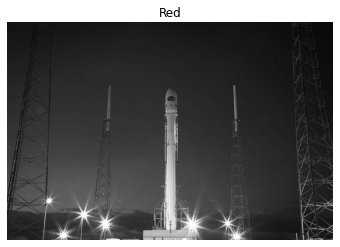

In [16]:
red = rocket_image[:, :, 0]
plt.imshow(red, cmap='gray')
plt.title('Red')
plt.axis('off')
plt.show()

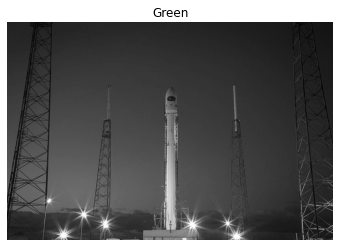

In [17]:
green = rocket_image[:, :, 1]
plt.imshow(green, cmap='gray')
plt.title('Green')
plt.axis('off')
plt.show()

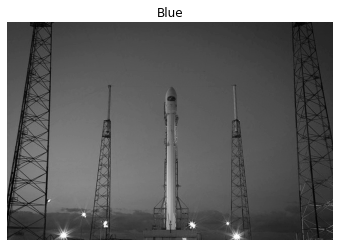

In [18]:
blue = rocket_image[:, :, 2]
plt.imshow(blue, cmap='gray')
plt.title('Blue')
plt.axis('off')
plt.show()

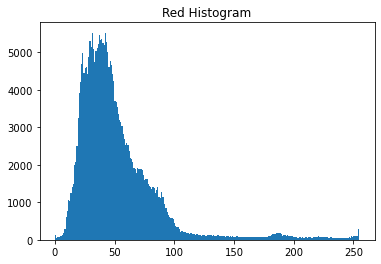

In [19]:
plt.hist(red.ravel(), bins = 256)
plt.title('Red Histogram')
plt.show()

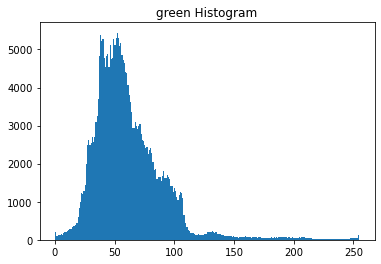

In [20]:
plt.hist(green.ravel(), bins = 256)
plt.title('green Histogram')
plt.show()

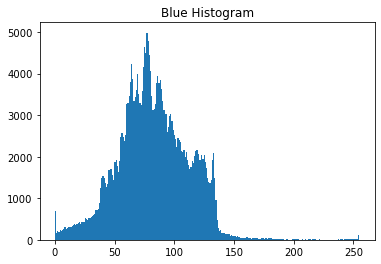

In [21]:
plt.hist(blue.ravel(), bins = 256)
plt.title('Blue Histogram')
plt.show()

## Global Threshhold apply on gray image

In [22]:
from skimage.filters import threshold_otsu
thresh = threshold_otsu(gray_scale)
binary = gray_scale > thresh

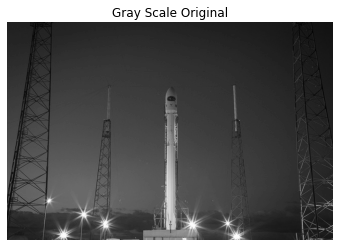

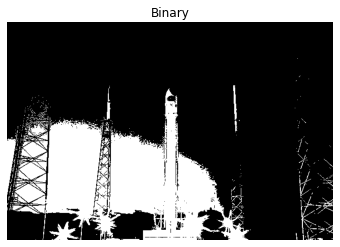

In [23]:
show_image(gray_scale, 'Gray Scale Original')
show_image(binary, 'Binary')

In [24]:
from skimage.filters import threshold_otsu
thresh = threshold_otsu(coffee_gray_scale)
binary = coffee_gray_scale > thresh

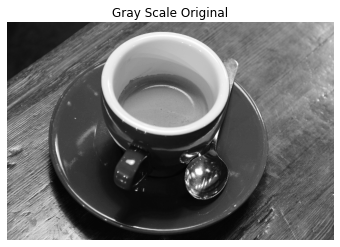

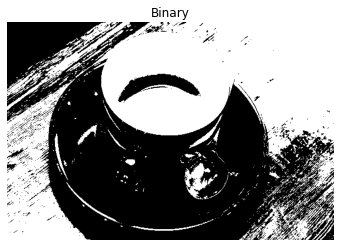

In [25]:
show_image(coffee_gray_scale, 'Gray Scale Original')
show_image(binary, 'Binary')

<ipython-input-26-996dc8120899>:2: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  page_gray_image = color.rgb2gray(page_image)


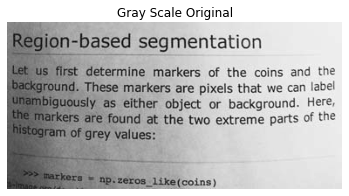

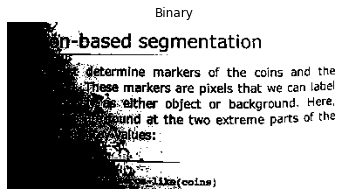

In [26]:
page_image = data.page()
page_gray_image = color.rgb2gray(page_image)
thresh = threshold_otsu(page_gray_image)
binary = page_gray_image > thresh
show_image(page_gray_image, 'Gray Scale Original')
show_image(binary, 'Binary')

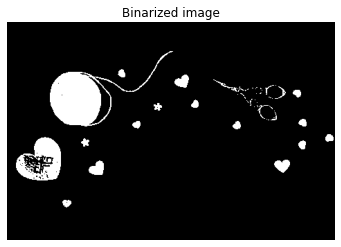

In [27]:
from skimage.color import rgb2gray
tool_image = plt.imread('tools.jpg')
gray_tools_image = rgb2gray(tool_image)

# Obtain the optimal thresh
thresh = threshold_otsu(gray_tools_image)

# Obtain the binary image by applying thresholding
binary_image = gray_tools_image > thresh

# Show the resulting binary image
show_image(binary_image, 'Binarized image')

## Local Thresh hold apply on gray image

In [28]:
from skimage.filters import threshold_local

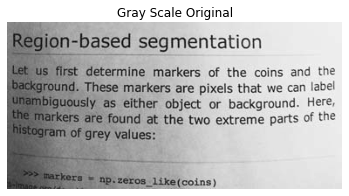

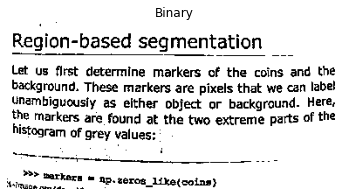

In [29]:
# When the background isn't that obvious
# Set the block size to 35
block_size = 35

local_thresh = threshold_local(page_gray_image, block_size, offset=10)
binary = page_gray_image > local_thresh
show_image(page_gray_image, 'Gray Scale Original')
show_image(binary, 'Binary')

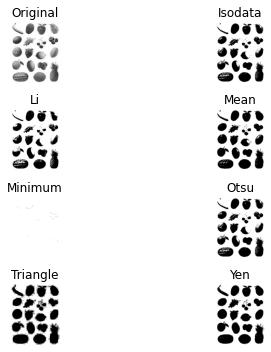

In [30]:
# Import the try all function
from skimage.filters import try_all_threshold

# Import the rgb to gray convertor function 
from skimage.color import rgb2gray

fruits_image = plt.imread('OIP (2).jpg')

# Turn the fruits_image to grayscale
grayscale = rgb2gray(fruits_image)

# Use the try all method on the resulting grayscale image
fig, ax = try_all_threshold(grayscale, verbose=False)

# Show the resulting plots
plt.show()

## Chapter 2 Filters, Contrast, Transformation and Morphology

In [31]:
# 1 . Filters : Edge Detection
# Plot comparison Function:
def plot_comparison(original, filtered, title_filtered):
    fig, (ax1, ax2) = plt.subplots(ncols = 2, figsize=(8, 6), sharex=True, sharey=True)
    ax1.imshow(original, cmap=plt.cm.gray)
    ax1.set_title('original')
    ax1.axis('off')
    ax2.imshow(filtered, cmap=plt.cm.gray)
    ax2.set_title(title_filtered)
    ax2.axis('off')

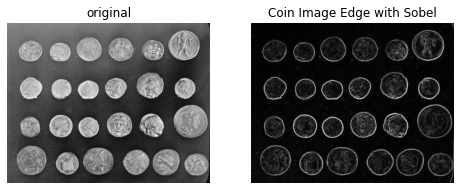

In [32]:
# sobel
from skimage.filters import sobel
edge_sobel = sobel(coin_gray_scale)
plot_comparison(coin_gray_scale, edge_sobel, "Coin Image Edge with Sobel")

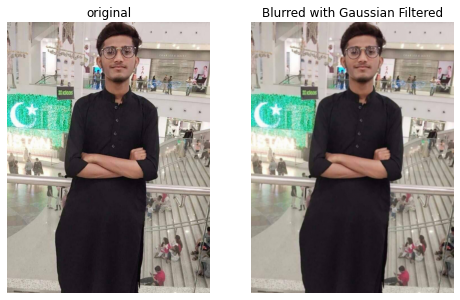

In [33]:
# 1.Filters : Gaussian_smoothing
from skimage.filters import gaussian
# let's filters blur edge of image
pic_image = plt.imread('pics.jpg')
gaussian_image = gaussian(pic_image, multichannel=True)
plot_comparison(pic_image, gaussian_image, 'Blurred with Gaussian Filtered')

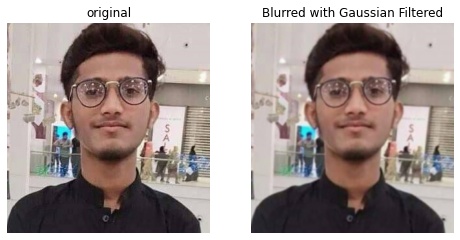

In [34]:
# 2 .let's filters blur edge of image
cv_image = plt.imread('CVPIC.jpg')
cv_gaussian_image = gaussian(cv_image, multichannel=True)
plot_comparison(cv_image, cv_gaussian_image, 'Blurred with Gaussian Filtered')

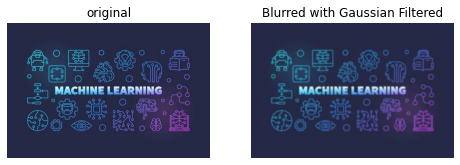

In [35]:
# let's filters blur edge of image
random_image = plt.imread('OIP.jpg')
random_gaussian_image = gaussian(random_image, multichannel=True)
plot_comparison(random_image, random_gaussian_image, 'Blurred with Gaussian Filtered')

C:\Users\Chacha Tech\anaconda3\lib\site-packages\skimage\exposure\exposure.py:181: UserWarning: This might be a color image. The histogram will be computed on the flattened image. You can instead apply this function to each color channel.
  hist, bin_centers = histogram(image, nbins)


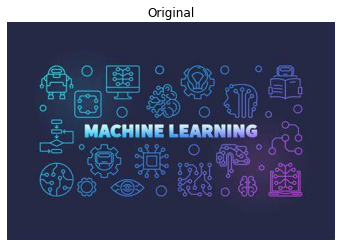

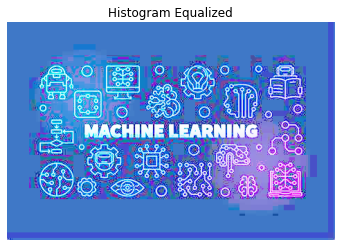

In [36]:
# Enhancement Contransting
# Types of Histogram Equalization : 3
# 1. Histogram Equalization
from skimage import exposure
image_eq = exposure.equalize_hist(random_image)
show_image(random_image, 'Original')
show_image(image_eq, 'Histogram Equalized')

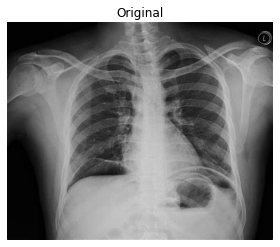

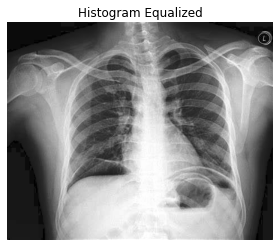

In [37]:
xray = plt.imread('xray.jpg')
xray_image_eq = exposure.equalize_hist(xray)
show_image(xray, 'Original')
show_image(xray_image_eq, 'Histogram Equalized')

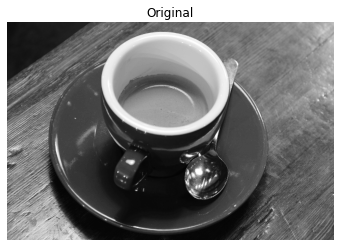

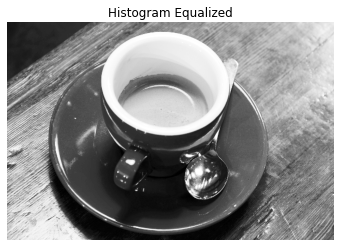

In [38]:
coffee_image_eq = exposure.equalize_hist(coffee_gray_scale)
show_image(coffee_gray_scale, 'Original')
show_image(coffee_image_eq, 'Histogram Equalized')

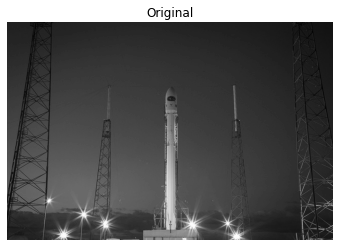

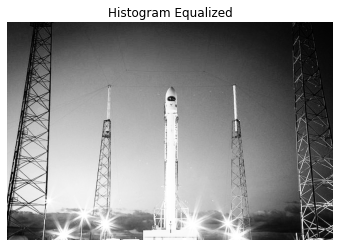

In [39]:
rocket_image_eq = exposure.equalize_hist(gray_scale)
show_image(gray_scale, 'Original')
show_image(rocket_image_eq, 'Histogram Equalized')

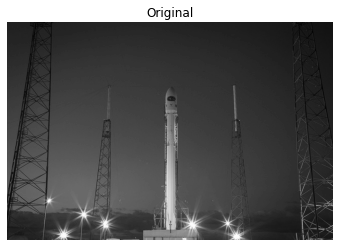

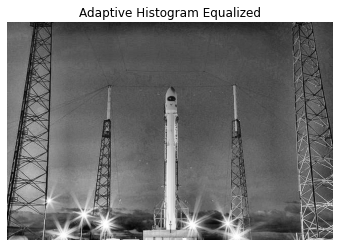

In [40]:
# 2. Contrast Limited Adaptive Histogram Equalization(CLAHE) 
from skimage import exposure
rocket_image_ad_eq = exposure.equalize_adapthist(gray_scale, clip_limit = 0.03)
show_image(gray_scale, 'Original')
show_image(rocket_image_ad_eq, 'Adaptive Histogram Equalized')

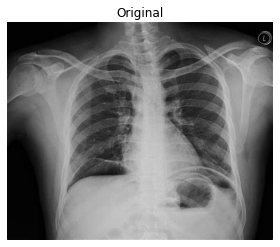

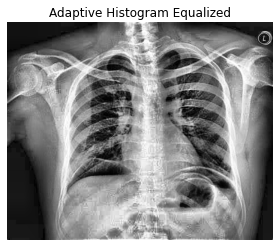

In [41]:
xray = plt.imread('xray.jpg')
xray_image_eq = exposure.equalize_adapthist(xray, clip_limit=0.03)
show_image(xray, 'Original')
show_image(xray_image_eq, 'Adaptive Histogram Equalized')

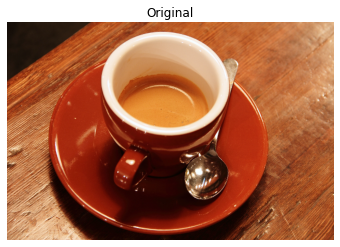

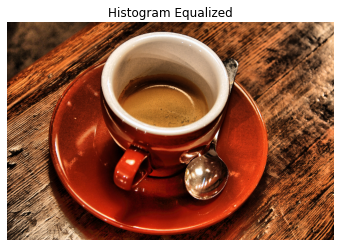

In [42]:
coffee_image_eq = exposure.equalize_adapthist(coffee_image, clip_limit=0.03)
show_image(coffee_image, 'Original')
show_image(coffee_image_eq, 'Histogram Equalized')

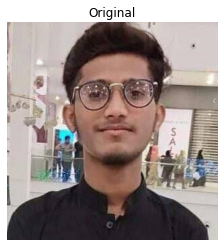

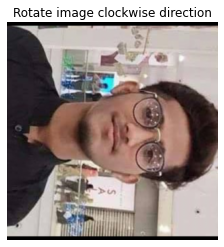

In [43]:
# 2. Transformation
# 1.Rotating Clockwise (-90)
from skimage.transform import rotate
rotate_clockwise = rotate(cv_image, -90)
show_image(cv_image, 'Original')
show_image(rotate_clockwise, 'Rotate image clockwise direction')

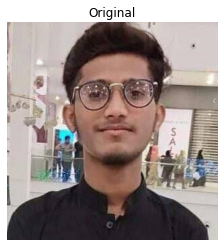

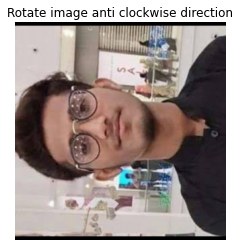

In [44]:
# 1.Rotating Anticlockwise(90)
from skimage.transform import rotate
rotate_anticlockwise = rotate(cv_image, 90)
show_image(cv_image, 'Original')
show_image(rotate_anticlockwise, 'Rotate image anti clockwise direction')

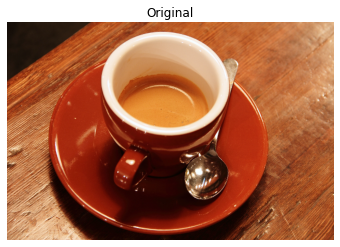

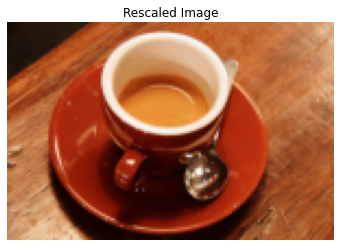

In [45]:
# 2.rescaling
from skimage.transform import rescale
rescaled_image = rescale(coffee_image, 1/4, anti_aliasing = True, multichannel = True)
show_image(coffee_image, 'Original')
show_image(rescaled_image, 'Rescaled Image')

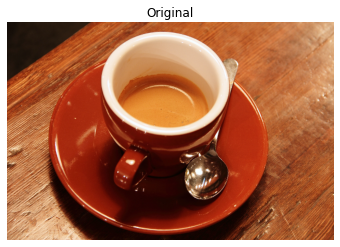

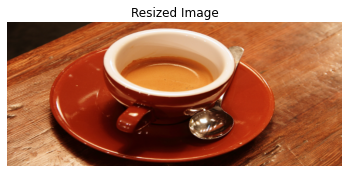

In [46]:
# 3.resizing
from skimage.transform import resize
height = 300
width  = 700
resized_image = resize(coffee_image, (height, width), anti_aliasing = True)
show_image(coffee_image, 'Original')
show_image(resized_image, 'Resized Image')

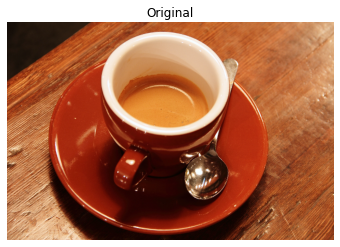

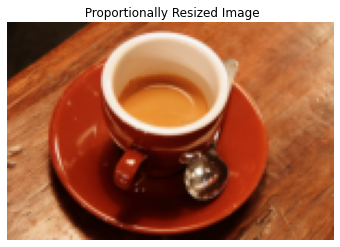

In [47]:
# 3.resizing proportionally
from skimage.transform import resize
height = coffee_image.shape[0]/4
width  = coffee_image.shape[1]/4
resized_image = resize(coffee_image, (height, width), anti_aliasing = True)
show_image(coffee_image, 'Original')
show_image(resized_image, ' Proportionally Resized Image')

In [48]:
# Last Morphology
# 1. Shapes in scikit-image
from skimage import morphology
square = morphology.square(4)
square

array([[1, 1, 1, 1],
       [1, 1, 1, 1],
       [1, 1, 1, 1],
       [1, 1, 1, 1]], dtype=uint8)

In [49]:
rectangle = morphology.rectangle(4, 2)
rectangle

array([[1, 1],
       [1, 1],
       [1, 1],
       [1, 1]], dtype=uint8)

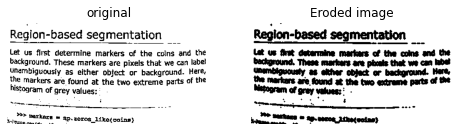

In [50]:
# Erosion in scikit_image
# selem = rectangle(12, 6)
eroded_image = morphology.binary_erosion(binary)
plot_comparison(binary, eroded_image, 'Eroded image')

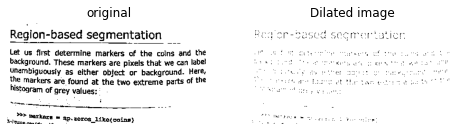

In [51]:
# Dilation in scikit_image
dilated_image = morphology.binary_dilation(binary)
plot_comparison(binary, dilated_image, 'Dilated image')

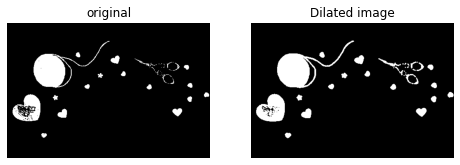

In [52]:
dilated_image = morphology.binary_dilation(binary_image)
plot_comparison(binary_image, dilated_image, 'Dilated image')

## Image restoration, Noise, Segmentation and Contours 

In [53]:
# 1. image restoration
from skimage.restoration import inpaint

In [54]:
def get_mask(image):
    mask = np.zeros(image.shape[:-1])
    mask[101:106, 0:240] = 1
    mask[152:154, 0:60] = 1
    mask[153:155, 60:100] = 1
    mask[154:156, 100:120] = 1
    mask[155:157, 120:140] = 1
    mask[212:217, 0:150] = 1
    mask[217:222, 150:256] = 1
    return mask

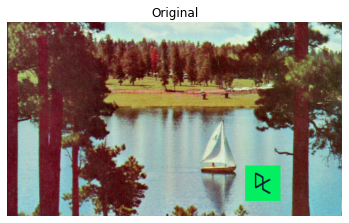

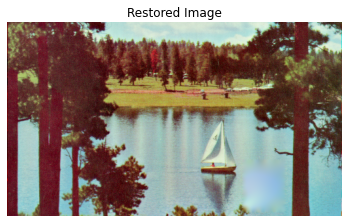

In [55]:
defect_image = plt.imread('logo.png')
mask = np.zeros(defect_image.shape[:-1])

# Set the pixels where the logo is to 1
mask[210:290, 360:425] = 1
restored_image = inpaint.inpaint_biharmonic(defect_image, mask, multichannel = True)
show_image(defect_image, 'Original')
show_image(restored_image, 'Restored Image')

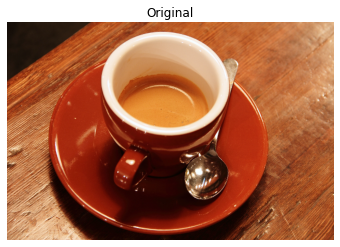

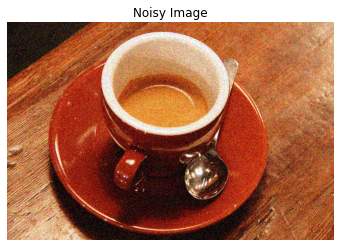

In [56]:
# 2 Noisy Image in scikit-image
from skimage.util import random_noise
noisy_image = random_noise(coffee_image)
show_image(coffee_image, 'Original')
show_image(noisy_image, 'Noisy Image')

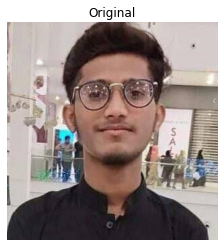

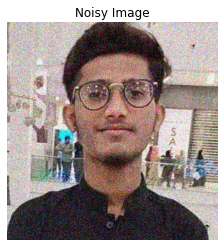

In [57]:
cv_noisy_image = random_noise(cv_image)
show_image(cv_image, 'Original')
show_image(cv_noisy_image, 'Noisy Image')

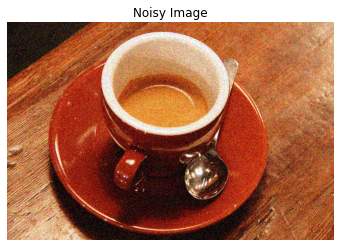

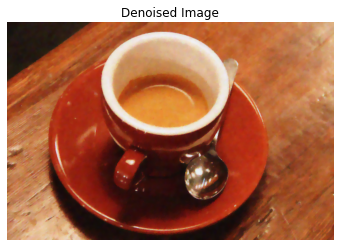

In [58]:
# 2. Reducing Noise
from skimage.restoration import denoise_tv_chambolle
denoised_image = denoise_tv_chambolle(noisy_image, weight=0.1, multichannel=True)
show_image(noisy_image, 'Noisy Image')
show_image(denoised_image, 'Denoised Image')

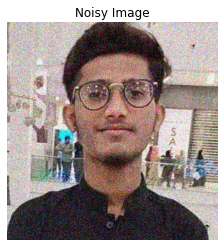

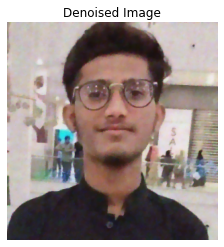

In [59]:
cv_denoised_image = denoise_tv_chambolle(cv_noisy_image, weight=0.1, multichannel=True)
show_image(cv_noisy_image, 'Noisy Image')
show_image(cv_denoised_image, 'Denoised Image')

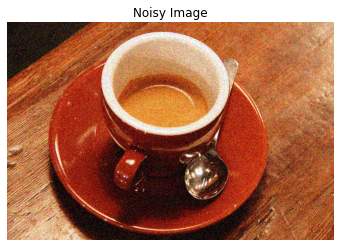

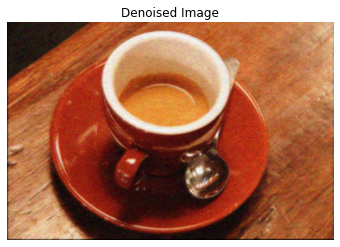

In [60]:
# 2.2 Denoised Bilateral
from skimage.restoration import denoise_bilateral
denoised_bilateral_image = denoise_bilateral(noisy_image, multichannel=True)
show_image(noisy_image, 'Noisy Image')
show_image(denoised_bilateral_image, 'Denoised Image')

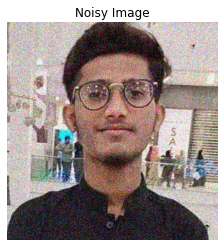

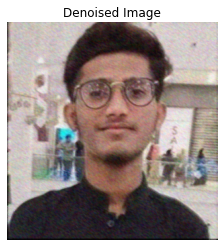

In [61]:
cv_denoised_bilateral_image = denoise_bilateral(cv_noisy_image, multichannel=True)
show_image(cv_noisy_image, 'Noisy Image')
show_image(cv_denoised_bilateral_image, 'Denoised Image')

<ipython-input-62-bc02960a5d76>:4: FutureWarning: skimage.measure.label's indexing starts from 0. In future version it will start from 1. To disable this warning, explicitely set the `start_label` parameter to 1.
  cv_image_segments = slic(cv_image)
<ipython-input-62-bc02960a5d76>:5: FutureWarning: The new recommended value for bg_label is 0. Until version 0.19, the default bg_label value is -1. From version 0.19, the bg_label default value will be 0. To avoid this warning, please explicitly set bg_label value.
  segmented_image = label2rgb(cv_image_segments, cv_image, kind='avg')


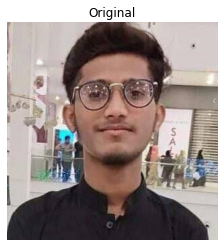

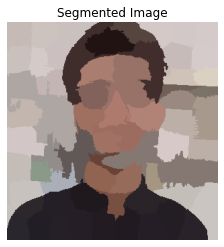

In [62]:
# unsupervised segmentation
from skimage.segmentation import slic
from skimage.color import label2rgb
cv_image_segments = slic(cv_image)
segmented_image = label2rgb(cv_image_segments, cv_image, kind='avg')
show_image(cv_image, 'Original')
show_image(segmented_image, 'Segmented Image')

<ipython-input-63-911d639f447b>:1: FutureWarning: skimage.measure.label's indexing starts from 0. In future version it will start from 1. To disable this warning, explicitely set the `start_label` parameter to 1.
  cv_image_segments = slic(cv_image, n_segments=500)
<ipython-input-63-911d639f447b>:2: FutureWarning: The new recommended value for bg_label is 0. Until version 0.19, the default bg_label value is -1. From version 0.19, the bg_label default value will be 0. To avoid this warning, please explicitly set bg_label value.
  segmented_image = label2rgb(cv_image_segments, cv_image, kind='avg')


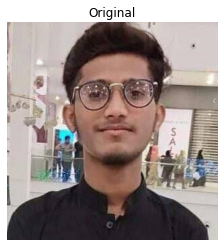

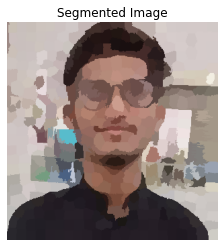

In [63]:
cv_image_segments = slic(cv_image, n_segments=500)
segmented_image = label2rgb(cv_image_segments, cv_image, kind='avg')
show_image(cv_image, 'Original')
show_image(segmented_image, 'Segmented Image')

In [64]:
# 3.  Finding contours using skimage
from skimage import color
from skimage.filters import threshold_otsu
from skimage import measure

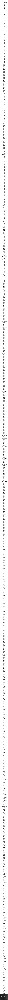

(723, 2)
(47, 2)
(35, 2)
(83, 2)
(235, 2)
(7, 2)
(7, 2)
(121, 2)
(5, 2)
(9, 2)
(5, 2)
(49, 2)
(11, 2)
(69, 2)
(7, 2)
(7, 2)
(9, 2)
(5, 2)
(19, 2)
(9, 2)
(5, 2)
(5, 2)
(13, 2)
(9, 2)
(5, 2)
(47, 2)
(7, 2)
(11, 2)
(13, 2)
(5, 2)
(5, 2)
(5, 2)
(9, 2)
(11, 2)
(7, 2)
(7, 2)
(5, 2)
(13, 2)
(9, 2)
(47, 2)
(5, 2)
(5, 2)
(15, 2)
(5, 2)
(7, 2)
(5, 2)
(57, 2)
(11, 2)
(5, 2)
(53, 2)
(17, 2)
(7, 2)
(7, 2)
(5, 2)
(5, 2)
(5, 2)
(5, 2)
(13, 2)
(5, 2)
(7, 2)
(9, 2)
(23, 2)
(33, 2)
(7, 2)
(7, 2)
(5, 2)
(47, 2)
(7, 2)
(47, 2)
(49, 2)
(47, 2)
(265, 2)
(55, 2)
(49, 2)
(5, 2)
(285, 2)
(19, 2)
(7, 2)
(17, 2)
(9, 2)
(9, 2)
(5, 2)
(9, 2)
(5, 2)
(91, 2)
(87, 2)
(5, 2)
(9, 2)
(5, 2)
(9, 2)
(5, 2)
(53, 2)
(5, 2)
(5, 2)
(21, 2)
(11, 2)
(5, 2)
(9, 2)
(7, 2)
(17, 2)
(7, 2)
(5, 2)
(15, 2)
(7, 2)
(13, 2)
(5, 2)
(5, 2)
(5, 2)
(5, 2)
(5, 2)
(19, 2)
(9, 2)
(9, 2)
(15, 2)
(7, 2)
(7, 2)
(51, 2)
(5, 2)


In [65]:
gray_image = color.rgb2gray(tool_image)
thresh = threshold_otsu(gray_image)
threshold_image = gray_image > thresh
contours_image = measure.find_contours(threshold_image, 0.8)
show_image(gray_image, contours_image)
# show_image(contours_image, 'Contours in image')
contours_image
for contour in contours_image:
    print(contour.shape)

## Advanced Operations, Detecting Faces and Features

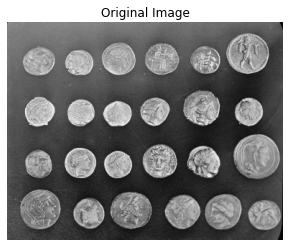

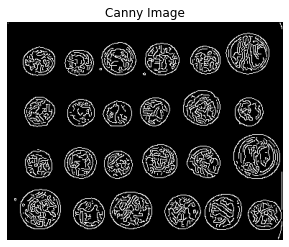

In [66]:
# 1. Detecting Edges using canny algorithm of skimage.feature
from skimage.feature import canny
canny_edges = canny(coin_gray_scale)
show_image(coin_gray_scale, 'Original Image')
show_image(canny_edges, 'Canny Image')

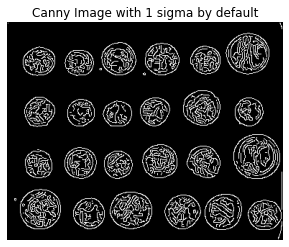

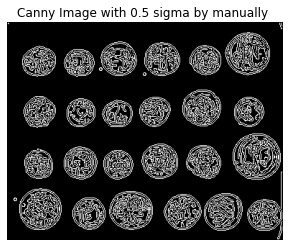

In [67]:
# 1/2. Detecting Edges with sigma attribute  using canny algorithm of skimage.feature
from skimage.feature import canny
canny_edges_sigma = canny(canny_edges, sigma = 0.5)
show_image(canny_edges, 'Canny Image with 1 sigma by default')
show_image(canny_edges_sigma, 'Canny Image with 0.5 sigma by manually ')

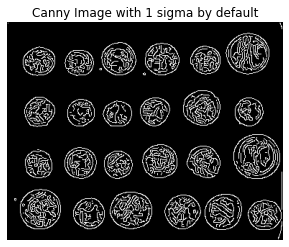

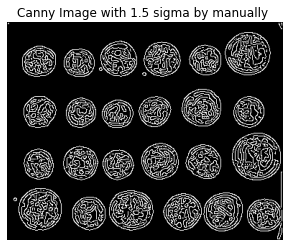

In [68]:
canny_edges_sigma = canny(canny_edges, sigma = 1.5)
show_image(canny_edges, 'Canny Image with 1 sigma by default')
show_image(canny_edges_sigma, 'Canny Image with 1.5 sigma by manually ')

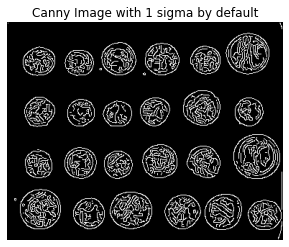

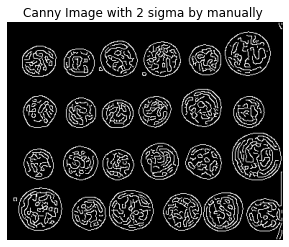

In [69]:
canny_edges_sigma = canny(canny_edges, sigma = 2)
show_image(canny_edges, 'Canny Image with 1 sigma by default')
show_image(canny_edges_sigma, 'Canny Image with 2 sigma by manually ')

In [70]:
# 2. Right around the corners.
# Corners detection using corner_harris algorithm
# show_image_with_corner : function
def show_image_with_corners(image, coords, title = 'Corners Detected'):
    plt.imshow(image, interpolation='nearest', cmap='gray')
    plt.title(title)
    plt.plot(coords[:, 1], coords[:, 0], '+r', markersize = 15)
    plt.axis('off')
    plt.show()

In [71]:
from skimage.feature import corner_harris

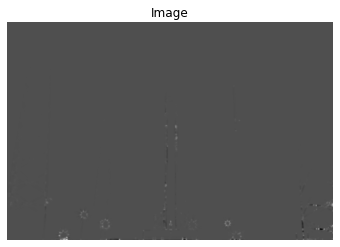

In [72]:
measure_image = corner_harris(gray_scale)
show_image(measure_image)

In [73]:
from skimage.feature import corner_peaks
coords = corner_peaks(corner_harris(gray_scale), min_distance = 5)
print("A total of", len(coords), "corners were detected")

<ipython-input-73-89f234e8f67a>:2: FutureWarning: Until version 0.16, threshold_rel was set to 0.1 by default. Starting from version 0.16, the default value is set to None. Until version 0.18, a None value corresponds to a threshold value of 0.1. The default behavior will match skimage.feature.peak_local_max. To avoid this warning, set threshold_rel=0.
  coords = corner_peaks(corner_harris(gray_scale), min_distance = 5)


A total of 31 corners were detected


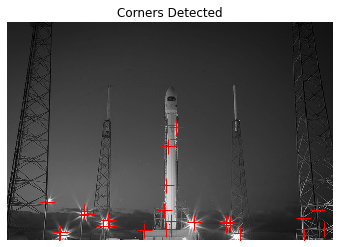

In [74]:
show_image_with_corners(gray_scale, coords)

In [75]:
from skimage.feature import Cascade
trained_file = data.lbp_frontal_face_cascade_filename()
detector = Cascade(trained_file)

In [76]:
detected = detector.detect_multi_scale(img=cv_image, 
                                       scale_factor = 1.2,
                                       step_ratio = 1,
                                       min_size=(10, 10),
                                       max_size=(200, 200)
                                      )

In [77]:
print(detected)

[{'r': 40, 'c': 89, 'width': 142, 'height': 142}, {'r': 57, 'c': 91, 'width': 132, 'height': 132}]


In [78]:
# 3. Face detection
def show_detected_face(result, detected, title='Face Image'):
    plt.imshow(result)
    img_desc = plt.gca()
    plt.set_cmap('gray')
    plt.title(title)
    plt.axis('off')
    
    for patch in detected:
        img_desc.add_patch(
            patches.Rectangle(
                (patch['c'], patch['r']),
                patch['width'],
                patch['height'],
                fill=False, color='r', linewidth=2)
        )
        plt.show()

NameError: name 'patches' is not defined

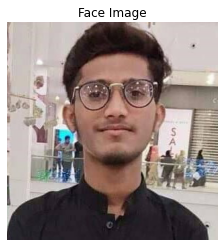

In [79]:
show_detected_face(cv_image, detected)

## Real World Application : Problem Solve Real World

In [87]:
def get_face(d):
    x, y = d['r'], d['c']
    width, height = d['r'] + d['width'] , d['c'] + d['height']
    face = cv_image[x: width, y:height]
    return face

In [92]:
def mergeBlurryFace(original, gaussian_image):
    x, y = d['r'], d['c']
    width, height = d['r'] + d['width'] , d['c'] + d['height']
    original[x:width, y:height] = gaussian_image
    return original

In [93]:
detected = detector.detect_multi_scale(img=cv_image,
                                      scale_factor = 1.2,
                                      step_ratio=1,
                                      min_size = (50, 50),
                                      max_size = (1000,1000))

for d in detected:
    face = get_face(d)
    gaussian_face = gaussian(face, multichannel=True, sigma = 5)
    resulting_image = mergeBlurryFace(cv_image, gaussian_face)
show_image(gaussian_face, 'Roe')

ValueError: assignment destination is read-only

In [ ]:
resulting_image = mergeBlurryFace(cv_image, gaussian_face)